In [1]:
import tifffile as tiff
import numpy as np
import pandas as pd
from tqdm import tqdm

In [2]:
import sys
sys.path.append('..')

import utils.load_csv as load_csv

set = load_csv.load_pandas()
set

/home/bendm/machine_learning/project/majority-vote-outlier-detection/stats/../utils/load_csv.py:20: DtypeWarning: Columns (91,94,209,213) have mixed types. Specify dtype option on import or set low_memory=False.
  frame = pd.read_csv(data_path, delimiter=";").iloc[:, -3:]


,classification,file_names,label
0,1,/home/bendm/machine_learning/project/majority-...,Singlet
1,1,/home/bendm/machine_learning/project/majority-...,Singlet
2,1,/home/bendm/machine_learning/project/majority-...,Singlet
3,1,/home/bendm/machine_learning/project/majority-...,Singlet
4,1,/home/bendm/machine_learning/project/majority-...,Singlet
...,...,...,...
9995,1,/home/bendm/machine_learning/project/majority-...,Singlet
9996,1,/home/bendm/machine_learning/project/majority-...,Singlet
9997,2,/home/bendm/machine_learning/project/majority-...,Doublet
9998,2,/home/bendm/machine_learning/project/majority-...,Doublet


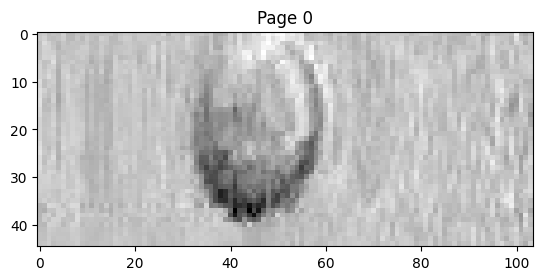

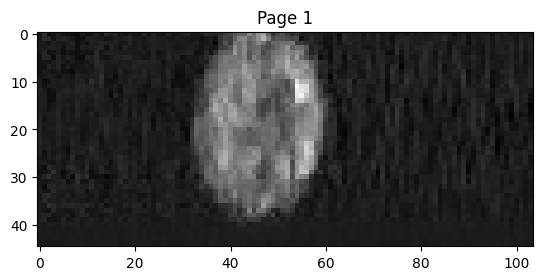

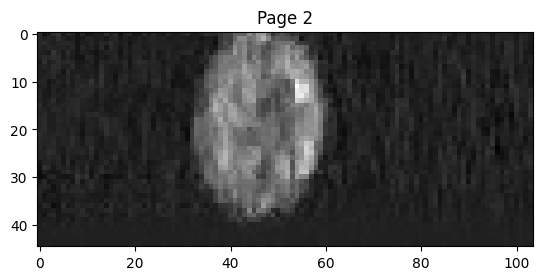

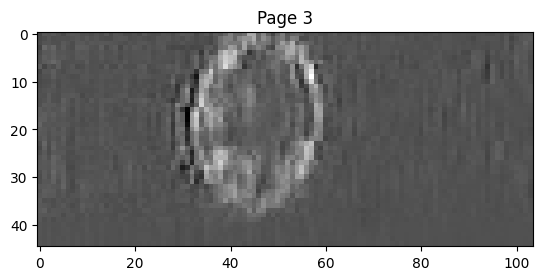

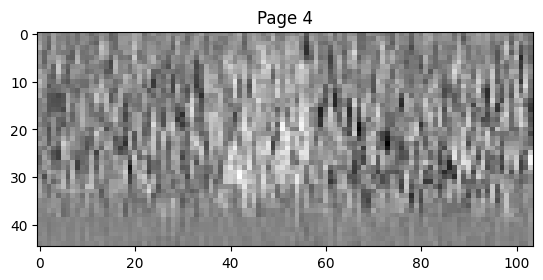

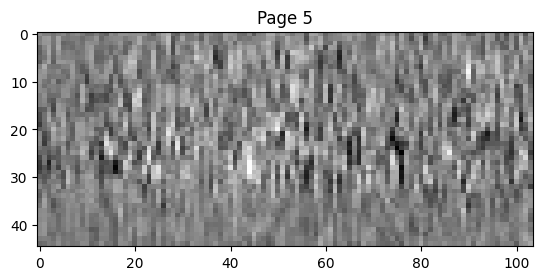

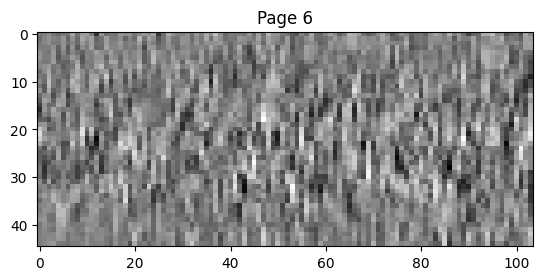

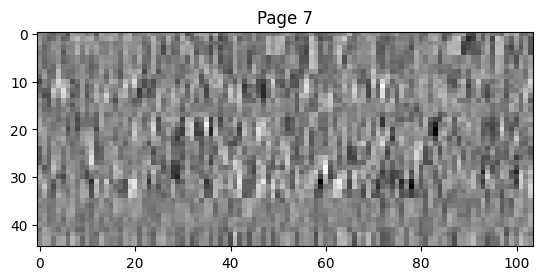

dtype('float32')

In [3]:
file = "../HT29_data/images/HT29 - YFP pos_00000000.tiff"

import matplotlib.pyplot as plt

img = tiff.imread(file)
for i, page in enumerate(img):
    plt.imshow(page, cmap="gray")
    plt.title(f"Page {i}")
    plt.show()
img.dtype

In [4]:
from skimage.filters import sobel


# Assuming pages is a list of 2D numpy arrays for each TIFF layer
def calculate_metrics(page):
    std_dev = np.std(page)
    edge_magnitude = np.mean(sobel(page))
    return std_dev, edge_magnitude

In [5]:
columns = ["file_name"]
for i in range(0, 8):
    columns.append("layer_" + str(i))

std_data = pd.DataFrame(columns=columns)
edge_data = pd.DataFrame(columns=columns)

std_data["file_name"] = set["file_names"]
edge_data["file_name"] = set["file_names"]

for file in tqdm(set["file_names"]):
    img = tiff.imread(file)
    for i,layer in enumerate(img):
        std,edge = calculate_metrics(layer)
        
        std_data.loc[std_data["file_name"] == file, "layer_" + str(i)] = std
        edge_data.loc[edge_data["file_name"] == file, "layer_" + str(i)] = edge

std_data

  3%|▎         | 271/10000 [00:04<02:33, 63.27it/s]


KeyboardInterrupt: 

### heatmap

In [ ]:
#drop the first column of each dataframe

std_data=std_data.iloc[:,1:]
edge_data=edge_data.iloc[:,1:]

In [ ]:
import plotly.express as px

# Assuming df_std, df_entropy, and df_edge are your dataframes for each metric
fig_std = px.imshow(
    std_data,
    title="Standard Deviation Across Layers for Each File",
    labels=dict(x="Layer", y="File", color="Std Dev"),
)
fig_std.show()

fig_edge = px.imshow(
    edge_data,
    title="Edge Magnitude Across Layers for Each File",
    labels=dict(x="Layer", y="File", color="Edge Magnitude"),
)
fig_edge.show()

### boxplot

In [ ]:
# Melt dataframes to long format for plotting
df_std_long = std_data.melt(var_name="Layer", value_name="Standard Deviation")
df_edge_long = edge_data.melt(var_name="Layer", value_name="Edge Magnitude")

# Plotting with Plotly Express
fig_std = px.box(df_std_long, x="Layer", y="Standard Deviation", title="Standard Deviation by Layer Across Files")
fig_edge = px.box(df_edge_long, x="Layer", y="Edge Magnitude", title="Edge Magnitude by Layer Across Files")

fig_std.show()
fig_edge.show()


This shows that we can use only layer 1,2 and 3 for the models without losing much information.

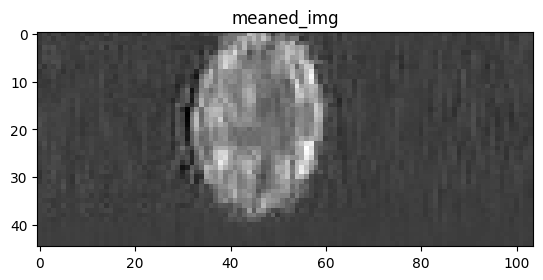

In [ ]:
img = tiff.imread(file)

img = img[1:4]
img = np.mean(img, axis=0)
plt.imshow(img, cmap="gray")
plt.title(f"meaned_img")
plt.show()

## testing max height of image

In [8]:
max_height = 0
max_width = 0

for file in tqdm(set["file_names"]):
    img = tiff.imread( file)
    max_height = max(max_height, img.shape[1])
    max_width = max(max_width, img.shape[2])

print(max_height, max_width)

100%|██████████| 10000/10000 [00:13<00:00, 751.44it/s]

173 104
